# Tobig's 19기 2주차 Optimization 과제

# Gradient Descent 구현하기

### 1)"..."표시되어 있는 빈 칸을 채워주세요
### 2)강의내용과 코드에 대해 공부한 내용을 마크마운 또는 주석으로 설명해주세요

## 데이터

In [2]:
import pandas as pd
import numpy as np
import random

In [3]:
data = pd.read_csv('assignment_2.csv')
data.head()

,Label,bias,experience,salary
0,1,1,0.7,48000
1,0,1,1.9,48000
2,1,1,2.5,60000
3,0,1,4.2,63000
4,0,1,6.0,76000


## Train Test 데이터 나누기

In [4]:
from sklearn.model_selection import train_test_split

In [5]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, 1:], data.iloc[:, 0], test_size = 0.25, random_state = 0)
#data.iloc[:, ~]: ~열을 선택하는 방법. data는 1열부터 해당되고, label은 0열이다.

In [6]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((150, 3), (50, 3), (150,), (50,))

## Scaling

experience와 salary의 단위, 평균, 분산이 크게 차이나므로 scaler를 사용해 단위를 맞춰줍니다. 

In [7]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
bias_train = X_train["bias"]
bias_train = bias_train.reset_index()["bias"]
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns = X_train.columns)
X_train["bias"] = bias_train
X_train.head()

,bias,experience,salary
0,1,0.187893,-1.143335
1,1,1.185555,0.043974
2,1,-0.310938,-0.351795
3,1,-1.629277,-1.341220
4,1,-1.308600,0.043974


이때 scaler는 X_train에 fit 해주시고, fit한 scaler를 X_test에 적용시켜줍니다.  
똑같이 X_test에다 fit하면 안돼요!

In [8]:
bias_test = X_test["bias"]
bias_test = bias_test.reset_index()["bias"]
X_test = pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)
X_test["bias"] = bias_test
X_test.head()

,bias,experience,salary
0,1,-1.344231,-0.615642
1,1,0.508570,0.307821
2,1,-0.310938,0.571667
3,1,1.363709,1.956862
4,1,-0.987923,-0.747565


In [9]:
# parameter 개수
N = len(X_train.loc[0])

In [10]:
# 초기 parameter들을 임의로 설정해줍니다.
parameters = np.array([random.random() for i in range(N)])
random_parameters = parameters.copy()
parameters

array([0.78308239, 0.80959219, 0.40618785])

### * LaTeX   

Jupyter Notebook은 LaTeX 문법으로 수식 입력을 지원하고 있습니다.  
LaTeX문법으로 아래의 수식을 완성해주세요  
http://triki.net/apps/3466  
https://jjycjnmath.tistory.com/117

## Dot product
## $z = X_i \theta$

In [11]:
def dot_product(X, parameters):
    z = 0
    for i in range(len(parameters)):
        z += X[i] * parameters[i]
    return z

## Logistic Function
## LaTex 문법: "## 달러 ~ 달러" 로 앞 뒤를 씌워야 한다.

## $p = \frac{1}{1 + e^-x}$

In [12]:
def logistic(X, parameters):
    z = X @ parameters # @ 는 넘파이 배열 간의 행렬곱을 지원한다.
    p = 1 / (1 + np.exp(-z))    
    return p

In [13]:
logistic(X_train.iloc[1], parameters)

0.853304881805007

## Object function

Object Function : 목적함수는 Gradient Descent를 통해 최적화 하고자 하는 함수입니다.  
<br>
선형 회귀의 목적함수
## $l(\theta) = \frac{1}{2}\Sigma(y_i - \theta^{T}X_i)^2$  
참고) $\hat{y_i} = \theta^{T}X_i$
  
로지스틱 회귀의 목적함수를 작성해주세요  
(선형 회귀의 목적함수처럼 강의에 나온대로 작성해주세요. 평균을 고려하는 것은 뒤에 코드에서 수행합니다)
## $l(p) = -\Sigma(y_i logp(X_i) + (1 - y_i)log(1 - p(X_i)))$

In [14]:
def minus_log_cross_entropy_i(X, y, parameters):
    p = logistic(X, parameters)
    loss = -1 * np.sum(np.log(p) * (y == 1) + np.log(1-p) * (y == 0)) #넘파이의 Boolean Mask를 곱셈한다.
    return p

In [55]:
def mse_i(X, y, parameters):
    y_hat = X @ parameters
    loss = 0.5 * ((y - y_hat) ** 2)
    print(loss)
    return loss

In [16]:
def batch_loss(X_set, y_set, parameters, loss_function, n): #n:현재 배치의 데이터 수
    loss = 0
    for i in range(X_set.shape[0]):
        X = X_set.iloc[i,:]
        y = y_set.iloc[i]
        loss += loss_function(X_set, y_set, parameters)
    loss = np.sum(loss) / n #loss 평균값으로 계산
    return loss

In [17]:
batch_loss(X_test, y_test, parameters, minus_log_cross_entropy_i, len(X_test))

35.814930688390106

## Gradient
위의 선형회귀의 목적함수 $l(\theta)$와 로지스틱회귀의 목적함수 $l(p)$의 gradient를 작성해주세요  
(위의 목적함수를 참고해서 작성해주세요 = 평균을 고려하는 것은 뒤에 코드에서 수행합니다)

## ${\partial\over{\partial \theta_j}}l(\theta)=-\Sigma(y_i - \theta^{T}X_i)X_{ij}  $
## ${\partial\over{\partial \theta_j}}l(p)=-\Sigma(y_i-p_i)x_{ij}$

In [53]:
def get_gradient_ij(X, y, parameters, j, model):
    if model == 'linear':
        y_hat = X@parameters
        gradient = -1 * (np.sum(y - y_hat) * X[j])
    else:
        p = logistic(X, parameters)
        gradient = -1 * (np.sum(y - p) * X[j])
    return gradient

In [19]:
get_gradient_ij(X_train.iloc[0,:], y_train.iloc[0], parameters, 1, 'logistic')

-0.07223156996147964

In [20]:
from IPython.display import Image

Image("C:/Users/rhskr/Desktop/배치알고리즘_구현.png")

FileNotFoundError: No such file or directory: 'C:/Users/rhskr/Desktop/배치알고리즘_구현.png'

FileNotFoundError: No such file or directory: 'C:/Users/rhskr/Desktop/배치알고리즘_구현.png'

<IPython.core.display.Image object>

## Batch Gradient
하나의 배치 (X_set, y_set)에 대해 기울기를 구하는 코드를 작성해주세요

In [21]:
def batch_gradient(X_set, y_set, parameters, model):
    gradients = [0 for _ in range(len(parameters))]
    
    for i in range(len(X_set)):
        X = X_set.iloc[i,:]
        y = y_set.iloc[i]
        for j in range(len(parameters)):
            gradients[j] += get_gradient_ij(X, y, parameters, j, model)
    
    return gradients

In [22]:
gradients1 = batch_gradient(X_train, y_train, parameters, 'logistic')
gradients1

[54.75520011407398, 13.136532072447688, 41.70965907857214]

## mini-batch
인덱스로 미니 배치 나누기

In [23]:
def batch_idx(X_train, batch_size):
    N = len(X_train)
    nb = (N // batch_size)+1 #number of batch
    idx = np.array([i for i in range(N)])
    idx_list = [idx[i*batch_size:(i+1)*batch_size] for i in range(nb) if len(idx[i*batch_size:(i+1)*batch_size]) != 0]
    return idx_list

batch_idx 함수에 대한 설명을 batch_size와 함께 간략하게 작성해주세요  
### 설명: X_train을 batch_size개만큼 묶는 함수로, 그 결과 nb개의 묶음(batch)가 생긴다.

## Update Parameters
기울기를 갱신하는 코드를 작성해주세요  
(loss와 마찬가지로 기울기를 갱신할 때 배치 사이즈를 고려해 평균으로 갱신해주세요)

In [24]:
def step(parameters, gradients, learning_rate, n): #n:현재 배치의 데이터 수
    for i in range(len(parameters)):
        gradients[i] *= learning_rate
    
    parameters -= gradients
    return parameters / n #마지막에 파라미터를 n으로 나눠주어야 한다.

In [25]:
step(parameters, gradients1, 0.01, len(X_train))

array([ 1.57020260e-03,  4.52151246e-03, -7.27249453e-05])

## Gradient Descent
위에서 작성한 함수들을 조합해서 경사하강법 함수를 완성해주세요

- learning_rate: 학습률  
- tolerance: Step이 너무 작아서 더 이상의 학습이 무의미할 때 학습을 멈추는 조건  
- batch: 기울기를 1번 갱신할 때 사용하는 데이터셋  
- epoch:  
- num_epoch:
<br>

BGD: "..."  
SGD: "..."  
MGD: "..."  
<br>
batch_size에 따른 경사하강법의 종류를 적어주세요  
batch_size=1 -> "..."  
batch_size=k -> "..."  
batch_size=whole -> "..."  

In [26]:
def gradient_descent(X_train, y_train, learning_rate = 0.1, num_epoch = 1000, tolerance = 0.00001, model = 'logistic', batch_size = 16):
    stopper = False
    
    #N, parameter, loss function을 설정하고, loss는 임의의 큰 수 999로 설정한다.
    N = len(X_train.iloc[0])
    parameters = np.random.rand(N)
    loss_function = minus_log_cross_entropy_i if model == 'logistic' else mse_i
    loss = 999
    batch_idx_list = batch_idx(X_train, batch_size)
    
    for epoch in range(num_epoch):
        if stopper:
            break
        for idx in batch_idx_list:
            X_batch = X_train.iloc[idx,]
            y_batch = y_train.iloc[idx]
            gradients = batch_gradient(X_batch, y_batch, parameters, model)
            parameters = step(parameters, gradients, learning_rate, batch_size)
            new_loss = batch_loss(X_batch, y_batch, parameters, loss_function, batch_size)

            
            #중단 조건
            if abs(new_loss - loss) < tolerance:
                stopper = True
                break
            loss = new_loss
        
        #100epoch마다 학습 상태 출력
        if epoch%100 == 0: #출력이 길게 나오면 check point를 수정해도 됩니다.
            print(f"epoch: {epoch}  loss: {new_loss}  params: {parameters}  gradients: {gradients}")
    
    return parameters

## Implement
경사하강법 함수를 이용해 최적의 모수 찾아보세요. 학습을 진행할 때, Hyper Parameter를 바꿔가면서 학습시켜보세요.

## Logistic Regression

In [27]:
new_param_bgd = gradient_descent(X_train, y_train, learning_rate = 0.1, num_epoch = 500, tolerance = 0.00001, model = 'logistic', batch_size = len(y_train))
new_param_bgd

epoch: 0  loss: 73.97633700528385  params: [-0.02730582 -0.00392192 -0.02628385]  gradients: [4.537913677582513, 1.5755402689539633, 4.1066574053936264]


array([-0.02160396,  0.01200919, -0.00941681])

In [28]:
new_param_sgd = gradient_descent(X_train, y_train, learning_rate = 0.1, num_epoch = 500, tolerance = 0.00001, model = 'logistic', batch_size = 1)

epoch: 0  loss: 0.2433723579893543  params: [-0.86567764  1.11931512 -1.24750555]  gradients: [0.02517724786660839, 0.01370148237024241, 0.017714478502687075]
epoch: 100  loss: 0.07444960887234392  params: [-1.93032582  4.1750199  -4.0676915 ]  gradients: [0.007538542114169345, 0.004102481828905919, 0.005304048438120385]
epoch: 200  loss: 0.07444587383710649  params: [-1.9303681   4.1751431  -4.06780374]  gradients: [0.007538159521704326, 0.004102273621720518, 0.005303779249604119]
epoch: 300  loss: 0.07444587352532125  params: [-1.9303681   4.17514311 -4.06780375]  gradients: [0.007538159489767116, 0.0041022736043402576, 0.0053037792271333935]
epoch: 400  loss: 0.07444587352529645  params: [-1.9303681   4.17514311 -4.06780375]  gradients: [0.007538159489764571, 0.004102273604338872, 0.005303779227131603]


In [ ]:
new_param_mgd = gradient_descent(X_train, y_train, learning_rate = 0.1, num_epoch = 500, tolerance = 0.00001, model = 'logistic', batch_size = 16)

epoch: 0  loss: 0.5860791501237366  params: [-0.92606378  1.07243792 -1.26041464]  gradients: [0.09040537568063392, 0.09932915912460402, 0.15117400930042257]
epoch: 100  loss: 0.5123514070267164  params: [-1.95228122  4.17932013 -4.05832604]  gradients: [0.05011304205233289, 0.07506083828274311, 0.0853821573475493]
epoch: 200  loss: 0.5123510407901125  params: [-1.95231597  4.17942224 -4.05841886]  gradients: [0.050112667755702826, 0.0750604568920097, 0.08538107396829336]
epoch: 300  loss: 0.5123510407645888  params: [-1.95231597  4.17942225 -4.05841887]  gradients: [0.050112667729615284, 0.07506045686542734, 0.08538107389278246]
epoch: 400  loss: 0.5123510407645868  params: [-1.95231597  4.17942225 -4.05841887]  gradients: [0.050112667729613404, 0.0750604568654254, 0.08538107389277716]


### Predict Label

In [31]:
y_predict = []
for i in range(len(y_test)):
    p = logistic(X_test.iloc[i,:], new_param_bgd)
    if p> 0.5 :
        y_predict.append(1)
    else :
        y_predict.append(0)
y_predict_random = []
for i in range(len(y_test)):
    p = logistic(X_test.iloc[i,:], random_parameters)
    if p> 0.5 :
        y_predict_random.append(1)
    else :
        y_predict_random.append(0)

### Confusion Matrix

In [29]:
from sklearn.metrics import *

In [32]:
tn, fp, fn, tp = confusion_matrix(y_test, y_predict).ravel()
confusion_matrix(y_test, y_predict)

array([[40,  0],
       [10,  0]], dtype=int64)

In [33]:
accuracy = (tp+tn) / (tp+fn+fp+tn)
print("accuracy:",accuracy)

accuracy: 0.8


## Linear regression
### $y = 0.5 + 2.7x$

### Data

In [47]:
raw_X = np.random.rand(150)
y = 2.7*raw_X + 0.5 + np.random.randn(150)

In [48]:
tmp = np.array([1 for _ in range(150)])
X = np.vstack((tmp, raw_X)).T
X = pd.DataFrame(X)
y = pd.Series(y)

### Estimation

In [49]:
#정규방정식
theta = np.linalg.inv(np.dot(X.T,X)).dot(X.T).dot(y)
theta

array([0.59968359, 2.31212621])

In [56]:
#경사하강법
new_param = gradient_descent(X, y, learning_rate=0.1, num_epoch= 300, model='linear')
new_param

0     9.070239
1     0.074740
2     0.184750
3     0.000121
4     0.070984
5     0.000031
6     1.054884
7     4.443459
8     0.127797
9     2.240061
10    3.773868
11    0.300445
12    0.089397
13    3.523756
14    2.258560
15    0.076907
dtype: float64
0     9.070239
1     0.074740
2     0.184750
3     0.000121
4     0.070984
5     0.000031
6     1.054884
7     4.443459
8     0.127797
9     2.240061
10    3.773868
11    0.300445
12    0.089397
13    3.523756
14    2.258560
15    0.076907
dtype: float64
0     9.070239
1     0.074740
2     0.184750
3     0.000121
4     0.070984
5     0.000031
6     1.054884
7     4.443459
8     0.127797
9     2.240061
10    3.773868
11    0.300445
12    0.089397
13    3.523756
14    2.258560
15    0.076907
dtype: float64
0     9.070239
1     0.074740
2     0.184750
3     0.000121
4     0.070984
5     0.000031
6     1.054884
7     4.443459
8     0.127797
9     2.240061
10    3.773868
11    0.300445
12    0.089397
13    3.523756
14    2.258560
15    0.07

KeyboardInterrupt: 

In [39]:
y_hat_NE = theta.dot(X.T)
y_hat_GD = new_param.dot(X.T)

### Visualization
시각화를 통해 정규방정식과 경사하강법을 통한 선형회귀를 비교해보세요  
(밑의 코드를 실행만 시키면 됩니다. 추가 코드 x)

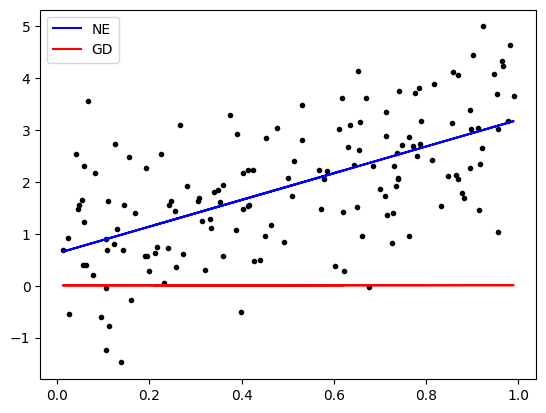

In [43]:
import matplotlib.pyplot as plt
plt.plot(X.iloc[:,1], y, '.k') #산점도
plt.plot(X.iloc[:,1], y_hat_NE, '-b', label = 'NE') #정규방정식
plt.plot(X.iloc[:,1], y_hat_GD, '-r', label = 'GD') #경사하강법
plt.legend()
plt.show()

In [ ]:
'''

'''